#### Automatic Port Operations with Image Recognition using a Convolutional Neural Network and Transfer learning model with MobileNet ####

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
from zipfile import ZipFile


zip_ref = ZipFile('/content/drive/MyDrive/DL/BOATS.zip','r')
zip_ref.extractall('/content/drive/MyDrive/DL')
zip_ref.close()



In [7]:
import os
import warnings
warnings.filterwarnings('ignore')

# lets define some constants
# boats_dir = '/kaggle/input/boats-zip-file/TRAIN_BOATS'
# test_dir = '/kaggle/input/boats-zip-file/TEST_BOATS/all'

# images used for training
train_dir = '/content/drive/MyDrive/DL/TRAIN_BOATS/'

# Images used for evaluating the model
test_dir = '/content/drive/MyDrive/DL/TEST_BOATS/'


height = 255
width = 255
batch_size = 32
total_train_images = 0
total_test_images = len(os.listdir(test_dir))

for sub_dir in os.listdir(train_dir):
  total_train_images += len(os.listdir(train_dir+'/'+sub_dir))

print('total train images = ', total_train_images)
print('total test images =  ', total_test_images)


total train images =  1162
total test images =   300


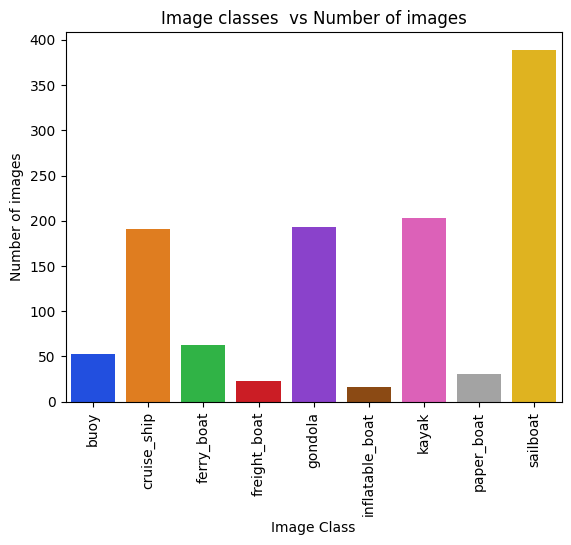

,buoy,cruise_ship,ferry_boat,freight_boat,gondola,inflatable_boat,kayak,paper_boat,sailboat
0,53,191,63,23,193,16,203,31,389


In [8]:
import os
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import pathlib

data_dir = pathlib.Path(train_dir)

def get_subdirectories(directory):
    with os.scandir(directory) as entries:
        return [entry.name for entry in entries if entry.is_dir()]
sub_dirs = get_subdirectories(data_dir)
images = {}

for d in sub_dirs:

    images[d] = [len(os.listdir(train_dir+'/'+d))]

df = pd.DataFrame(images)
sns.barplot(data = df ,palette= sns.color_palette("bright"))
plt.xlabel('Image Class')
plt.ylabel('Number of images')
plt.title(f'Image classes  vs Number of images' )
plt.xticks(rotation = 90)
plt.show()
df

There is a predominence of the sailboat class in the training data. Images classes gondola, kayak and cruise ships are also non-trivial. We can therefor expect mistclassification of the other image classes as thse main majority classes

In [58]:
# using the latest tf.data for efficient input pipelines.
# The td.data.Dataset provides APIS to efficiently cache image data in the memory and prefetch images asynchronously while a step is executing.
# I wil be using this feature for faster training
# https://www.tensorflow.org/guide/data

import tensorflow as tf
def get_ds(data_dir,validation_split=0.2,subset='training',seed = 43,image_size=(255,255),batch_size=32):
    train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=validation_split,
    subset=subset,
    seed=seed,
    image_size=image_size,
    batch_size=batch_size)
    train_ds.class_names
    return train_ds

train_ds = get_ds(data_dir,image_size=(height,width),batch_size=batch_size)
type(train_ds)

Found 1162 files belonging to 9 classes.
Using 930 files for training.


tensorflow.python.data.ops.prefetch_op._PrefetchDataset

In [49]:
val_ds = get_ds(data_dir,validation_split=0.2,subset='validation',seed = 43,image_size=(height,width),batch_size=batch_size)

Found 1162 files belonging to 9 classes.
Using 232 files for validation.


In [50]:
class_names = train_ds.class_names
print(class_names)

['buoy', 'cruise_ship', 'ferry_boat', 'freight_boat', 'gondola', 'inflatable_boat', 'kayak', 'paper_boat', 'sailboat']


Some sample images from the training split is displayed below

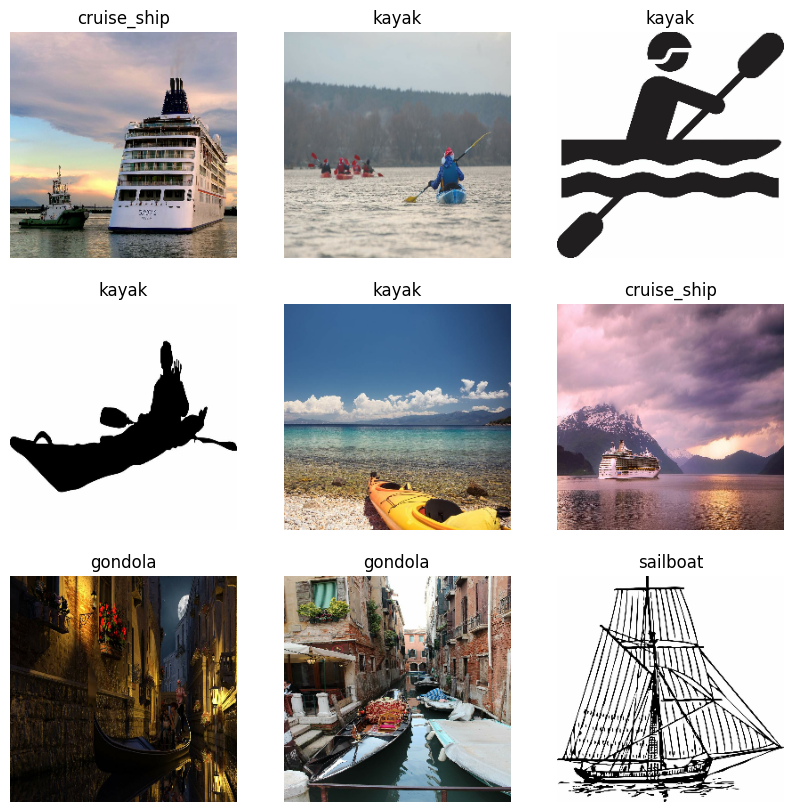

In [12]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))

for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

https://www.tensorflow.org/guide/data_performance

Using `cache`, `prfetch` and `AUTOTUNE` for efficient handling of input data. I tested the code with and without caching and prefetching. Without caching and prefetching the code runs much slower. With expensive GPU time, this can be crucial.

In [47]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [54]:
# import library
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow import keras
import warnings
warnings.filterwarnings('ignore')

model = Sequential([
  ##--- starting data augmenttaion
  layers.RandomFlip("horizontal",input_shape=(height,width,3)),
  layers.RandomRotation(0.1),
  layers.RandomZoom(0.1),
  layers.RandomShear(x_factor=0.1, y_factor=0.1),

  ##---- Data Augmentation ends

  # Image Scaling layer
  layers.Rescaling(1./255, input_shape=(height, width, 3)),

  # First convolution layer.convolutiion with 32 filters with a 3x3 kernal matrix
  layers.Conv2D(32, (3,3), padding='same', activation='relu'),
  layers.MaxPooling2D(), # Use max pooling

  # Second Convolution layer
  layers.Conv2D(32, (3,3), padding='same', activation='relu'),
  layers.MaxPooling2D(),

  # #Global Average Pooling layer. This does not work as GlobalAveragePooling makes
  # input dimension to the next layer incompatible(May be additional transformations are needed?)
  # layers.GlobalAveragePooling2D(),

  # 3rd Convolution layer
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),

  # 4th Convolution layer
  layers.Conv2D(128, 3, padding='same', activation='relu'),
  layers.GlobalMaxPooling2D(),


  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(128, activation='relu'),
  layers.Dropout(0.2),
  layers.Dense(len(class_names))

])
# comple the model
model.compile(optimizer='adam',
              # Recomended for sparse matrix data ( which images are)
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              #This does not work
              # metrics=[keras.metrics.Accuracy(),keras.metrics.Precision(),keras.metrics.Recall()]
              metrics=['accuracy']
             )
model.summary()

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ random_flip_11 (RandomFlip)          │ (None, 255, 255, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_rotation_11 (RandomRotation)  │ (None, 255, 255, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_zoom_11 (RandomZoom)          │ (None, 255, 255, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_shear_10 (RandomShear)        │ (None, 255, 255, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ rescaling_11 (Rescaling)             │ (None, 255, 255, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_44 (Conv2D)                   │ (None, 255, 255, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_33 (MaxPooling2D)      │ (None, 127, 127, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_45 (Conv2D)                   │ (None, 127, 127, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_34 (MaxPooling2D)      │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_46 (Conv2D)                   │ (None, 63, 63, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_35 (MaxPooling2D)      │ (None, 31, 31, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_47 (Conv2D)                   │ (None, 31, 31, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling2d_11              │ (None, 128)                 │               0 │
│ (GlobalMaxPooling2D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_11 (Flatten)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_28 (Dense)                     │ (None, 128)                 │          16,512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_29 (Dense)                     │ (None, 128)                 │          16,512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_11 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_30 (Dense)                     │ (None, 9)                   │           1,161 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 136,681 (533.91 KB)

 Trainable params: 136,681 (533.91 KB)

 Non-trainable params: 0 (0.00 B)

I have extended the `ModelCheckpoint` class so that I can extract the epoch number at which the training ended. `ModelCheckpoint` does not save this parameteer as pasrt of its init(it stores `save_freq` = epoch , which is a string). I have overrided the on_epoch_end method to extract the last epoh at which training stopped which can then be used seamlessly in plotting accuracy and loss graphs

In [52]:
from tensorflow.keras.callbacks import ModelCheckpoint

# Extending the ModelCheckPoint class
class MyCheckpoint(ModelCheckpoint):

    def __init__(self,
                 filepath,
                 monitor="val_loss",
                 verbose=0,
                 save_best_only=False,
                 save_weights_only=False,
                 mode="auto",
                 save_freq="epoch",
                 initial_value_threshold=None,
                 ):
        super().__init__(filepath,
                         monitor,
                         verbose,
                         save_best_only,
                         save_weights_only,
                         mode,
                         save_freq,
                         initial_value_threshold)

        self.last_epoch_number = 0
    # This function is called at the end of each epoch. I am overriding this method
    def on_epoch_end(self,epoch,logs=None):
        super().on_epoch_end(epoch,logs)
        self.last_epoch_number =  epoch+1
        print(f'epoch {self.last_epoch_number} completed')


In [55]:
from tensorflow.keras.callbacks import EarlyStopping


early_stop=EarlyStopping(monitor='val_loss',mode='min',verbose=1,patience=10,min_delta=0.01)
checkpoint=MyCheckpoint('best_model.keras',monitor='val_loss',mode='min',verbose=1,save_best_only=True)

epochs=100
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  batch_size = batch_size,
  # not specified. But i thought this was a good idea
  callbacks = [early_stop,checkpoint]
)

Epoch 1/100
29/30 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step - accuracy: 0.3023 - loss: 1.9670
Epoch 1: val_loss improved from inf to 1.82342, saving model to best_model.keras
epoch 1 completed
30/30 ━━━━━━━━━━━━━━━━━━━━ 10s 228ms/step - accuracy: 0.3037 - loss: 1.9626 - val_accuracy: 0.3017 - val_loss: 1.8234
Epoch 2/100
29/30 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step - accuracy: 0.3320 - loss: 1.8247
Epoch 2: val_loss improved from 1.82342 to 1.81882, saving model to best_model.keras
epoch 2 completed
30/30 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.3320 - loss: 1.8248 - val_accuracy: 0.3017 - val_loss: 1.8188
Epoch 3/100
29/30 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step - accuracy: 0.3491 - loss: 1.7935
Epoch 3: val_loss improved from 1.81882 to 1.80132, saving model to best_model.keras
epoch 3 completed
30/30 ━━━━━━━━━━━━━━━━━━━━ 11s 242ms/step - accuracy: 0.3483 - loss: 1.7961 - val_accuracy: 0.3017 - val_loss: 1.8013
Epoch 4/100
29/30 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.3651 - loss: 

In [56]:
# print training accuracy
def print_scores(model,val_ds,train_ds):
  score_test = model.evaluate(val_ds, verbose=0)
  print('Test loss:%.4f' % score_test[0])
  print('Test accuracy:%.4f'% score_test[1])
  score_train= model.evaluate(train_ds, verbose=0)
  print('Train loss:%.4f'% score_train[0])
  print('train accuracy:%.4f'% score_train[1])
print_scores(model,val_ds,train_ds)

Test loss:1.5528
Test accuracy:0.5431
Train loss:1.1632
train accuracy:0.5968


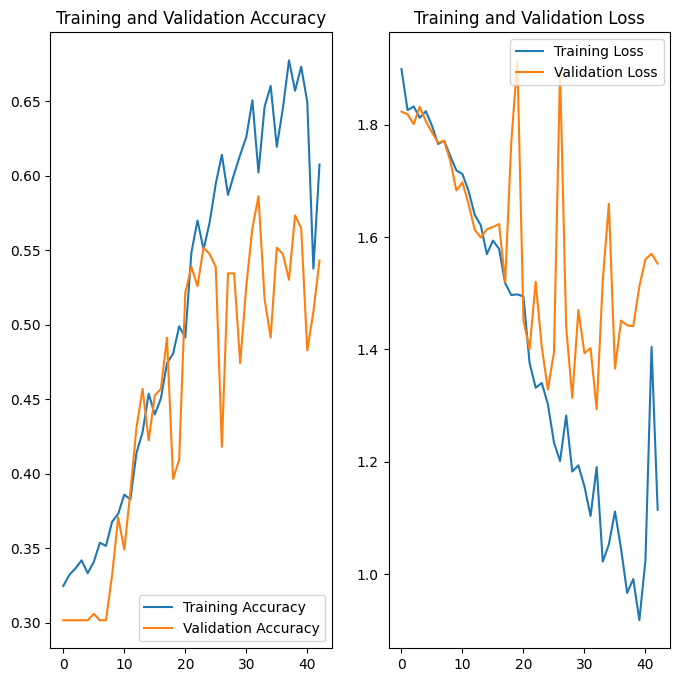

In [57]:
import matplotlib.pyplot as plt
def plot_accuracy_loss_graphs(history):
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']

  loss = history.history['loss']
  val_loss = history.history['val_loss']
  epochs_range = range(checkpoint.last_epoch_number)

  plt.figure(figsize=(8, 8))
  plt.subplot(1, 2, 1)
  plt.plot(epochs_range, acc, label='Training Accuracy')
  plt.plot(epochs_range, val_acc, label='Validation Accuracy')
  plt.legend(loc='lower right')
  plt.title('Training and Validation Accuracy')

  plt.subplot(1, 2, 2)
  plt.plot(epochs_range, loss, label='Training Loss')
  plt.plot(epochs_range, val_loss, label='Validation Loss')
  plt.legend(loc='upper right')
  plt.title('Training and Validation Loss')
  plt.show()
plot_accuracy_loss_graphs(history)

Model performance evaluation

In [59]:
import numpy as np
import os



def get_predicted_labels(model):
    '''
    param : a Sequential model
    returns : a dictionary of image_paths and predicted labels

    '''
    images = os.listdir(test_dir)
    image_label_map = {}

    for i, image in enumerate(images):
        path = test_dir+'/'+image
        img = tf.keras.utils.load_img(path, target_size=(height, width))
        img_array = tf.keras.utils.img_to_array(img)
        img_array = tf.expand_dims(img_array, 0) # Create a batch
        predictions = model.predict(img_array,verbose=False)
        score = tf.nn.softmax(predictions[0])
        max_score = np.max(score)
        image_label_map[path] = class_names[np.argmax(score)]


    return image_label_map

get the test images with their predicted labels

In [60]:
# get the test images with their predicted labels
image_map = get_predicted_labels(model)
print('size of image map = ',len(image_map))


size of image map =  300


**Visualize the predictions**

Predictions for CNN Model. The title of the images are the model's predictions



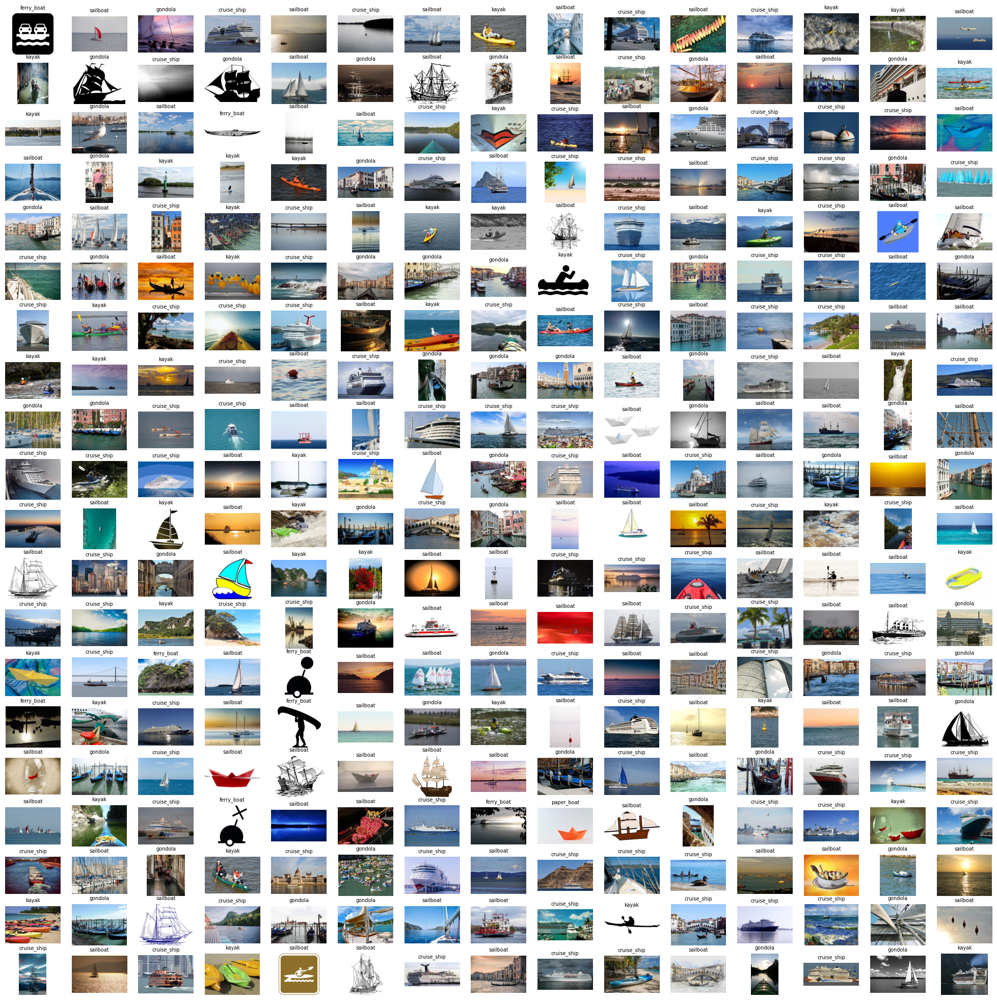

In [62]:
import matplotlib.image as mpimg

def display_test_images(image_map,model_name):
    print(f'Predictions for {model_name}\n')
    plt.figure(figsize=(25,25))
    for  i, image_path in enumerate(image_map.keys()):
        plt.subplot(20,15,i+1)
        img = mpimg.imread(image_path)
        plt.imshow(img)
        plt.axis('off')
        plt.title(image_map.get(image_path),fontsize=7, fontweight=20)
    plt.show()
display_test_images(image_map,'CNN Model. The title of the images are the model\'s predictions')

**Metrics calculation. For doing this, we need true and predicted labels for the validation dataset**

In [63]:
from sklearn.metrics import confusion_matrix
def get_metrics(model,validation_ds,val_split = 0.2):
    num_images = int(total_train_images * val_split)
    num_batches = int(num_images/32)
    residuals = int(num_images % 32)
    print(num_images,num_batches,residuals)
    true_labels = []
    predicted_labels = []
    for images, labels in validation_ds.take(num_batches):
      true_labels.extend(labels)
      for i in range(batch_size): # prediction for each image in the batch
          img_array = tf.keras.utils.img_to_array(images[i])
          img_array = tf.expand_dims(img_array, 0) # Create a batch
          predictions= model.predict(img_array,verbose=False)
          score = tf.nn.softmax(predictions[0])
          predicted_labels.append(np.argmax(score))
    print(i)
    # True and predicted labels should match
    print(len(true_labels),len(predicted_labels))
    return true_labels, predicted_labels
true_labels, predicted_labels = get_metrics(model,val_ds)

232 7 8
31
224 224


**Confusion Matrix**

Confusion Matrix
[[ 0  3  2  0  0  0  4  0  3]
 [ 0 35  0  0  1  0  2  0  8]
 [ 0  6  1  0  0  0  1  0  5]
 [ 0  1  0  0  0  0  1  0  1]
 [ 0  5  0  0 20  0  2  0  5]
 [ 0  1  0  0  0  0  1  0  0]
 [ 1  6  0  0  3  0 27  0  7]
 [ 0  0  0  0  0  0  1  0  2]
 [ 1 18  1  0  5  0  5  0 39]]

Confusion Matrix Displayed



<Figure size 1000x1000 with 0 Axes>

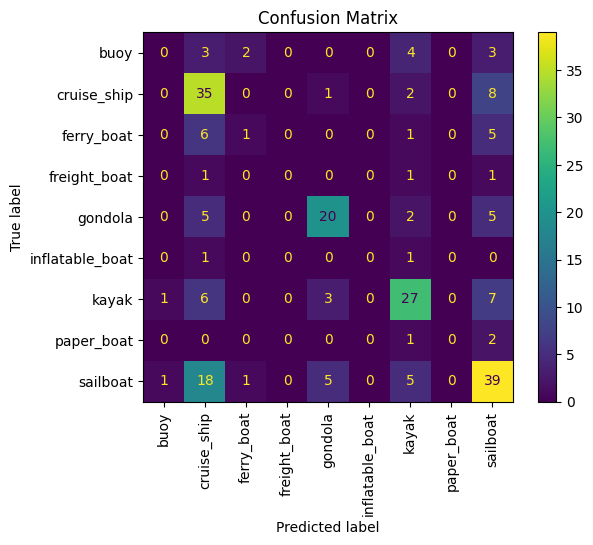

In [64]:
from sklearn.metrics import ConfusionMatrixDisplay

cm = confusion_matrix(true_labels,predicted_labels)
print('Confusion Matrix')
print(cm)
print()

print('Confusion Matrix Displayed\n')
plt.figure(figsize = (10,10))
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=class_names)
disp.plot()
plt.title('Confusion Matrix')
plt.xticks(rotation=90)
plt.show()

As expected Sailboat,Kayak,Gondola and Cruise ship has high true positive values because of large number of images in the training data. Most mis-classifications are seen in the other image classes

**Classification Report**

In [65]:
from sklearn.metrics import classification_report
import warnings
warnings.filterwarnings('ignore')

cl_report = classification_report(true_labels,predicted_labels)
print(cl_report)

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        12
           1       0.47      0.76      0.58        46
           2       0.25      0.08      0.12        13
           3       0.00      0.00      0.00         3
           4       0.69      0.62      0.66        32
           5       0.00      0.00      0.00         2
           6       0.61      0.61      0.61        44
           7       0.00      0.00      0.00         3
           8       0.56      0.57      0.56        69

    accuracy                           0.54       224
   macro avg       0.29      0.29      0.28       224
weighted avg       0.50      0.54      0.51       224



## Transfer Learning with MobileNet application ##

In [66]:
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2
print('imported')

imported


In [67]:
mob_model = tf.keras.applications.MobileNet(
    input_shape=(height,width,3),
    include_top=False,
    weights="imagenet",
    input_tensor=None,
    pooling=None,
    classes=1000,
    classifier_activation="softmax",
    name='MobileNet',
)

17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


**Build an FCN**

In [68]:
train_ds = get_ds(data_dir,validation_split=0.3,subset='training',seed = 1,image_size=(height,width),batch_size=batch_size)

Found 1162 files belonging to 9 classes.
Using 814 files for training.


In [69]:
val_ds = get_ds(data_dir,validation_split=0.3,subset='validation',seed = 1,image_size=(height,width),batch_size=batch_size)

Found 1162 files belonging to 9 classes.
Using 348 files for validation.


In [70]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [79]:

mob_model.trainable=False
model_t=Sequential()
model_t.add(mob_model)

#-----Data Augmentaion start
model_t.add(layers.RandomFlip("horizontal",input_shape=(height,width,3)))
model_t.add(layers.RandomRotation(0.1))
model_t.add(layers.RandomZoom(0.1))
model_t.add(layers.RandomShear(x_factor=0.1, y_factor=0.1))
#-----Data Augmentation ends
model_t.add(layers.GlobalAveragePooling2D())


## Dropout at 0.5 produces much lesse overfitting.
## Any lesser value increases training accuracy substantially, but testing acuracy doesnt improve
## Using Dropout as 0.1 as specified in the problem statement gives a training accuracy of 1, but a tetsing accuracy of 65%
## and results in worse classification

model_t.add(layers.Dropout(0.5)) #


model_t.add(layers.Dense(256, activation='relu'))
model_t.add(layers.BatchNormalization())
model_t.add(layers.Dropout(0.5))

model_t.add(layers.Dense(128, activation='relu'))
model_t.add(layers.BatchNormalization())
model_t.add(layers.Dropout(0.5))

model_t.add(layers.Dense(len(class_names),activation='softmax'))
model_t.summary()


Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ MobileNet (Functional)               │ (None, 8, 8, 1024)          │       3,228,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_flip_16 (RandomFlip)          │ (None, 8, 8, 1024)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_rotation_16 (RandomRotation)  │ (None, 8, 8, 1024)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_zoom_16 (RandomZoom)          │ (None, 8, 8, 1024)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_shear_14 (RandomShear)        │ (None, 8, 8, 1024)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_7           │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_24 (Dropout)                 │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_43 (Dense)                     │ (None, 256)                 │         262,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_25 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_44 (Dense)                     │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_9                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_26 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_45 (Dense)                     │ (None, 9)                   │           1,161 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,526,857 (13.45 MB)

 Trainable params: 297,225 (1.13 MB)

 Non-trainable params: 3,229,632 (12.32 MB)

In [80]:
### Two problems I faced here.
# 1. categorical_crossentropy doesnt work.
#    Documenation says that categorical_crossentropy should be used for one-hot encoded features.
#    Otherwise sparse_categorical_crossentropy should be used

# 2. The problem statement asks to compile using accuracy, precision and recall for metrics
#    However this does not work:
#    metrics=['accuracy','precision','recall'] ( may be i am using the wrong api?)
#    Infact, no other value other than accuracy works for metrics

model_t.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [81]:

early_stop=EarlyStopping(monitor='val_loss',mode='min',verbose=1,patience=10,min_delta=0.01)
checkpoint=MyCheckpoint('best_model.keras',monitor='val_loss',mode='min',verbose=1,save_best_only=True)

epochs=100
history_t = model_t.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  batch_size = batch_size,
  # not specified. But i thought this was a good idea
  callbacks = [early_stop,checkpoint]
)

Epoch 1/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.1242 - loss: 3.3185
Epoch 1: val_loss improved from inf to 1.99121, saving model to best_model.keras
epoch 1 completed
26/26 ━━━━━━━━━━━━━━━━━━━━ 18s 248ms/step - accuracy: 0.1248 - loss: 3.3136 - val_accuracy: 0.3649 - val_loss: 1.9912
Epoch 2/100
25/26 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - accuracy: 0.2112 - loss: 2.8402
Epoch 2: val_loss improved from 1.99121 to 1.71084, saving model to best_model.keras
epoch 2 completed
26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - accuracy: 0.2137 - loss: 2.8318 - val_accuracy: 0.4368 - val_loss: 1.7108
Epoch 3/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - accuracy: 0.2753 - loss: 2.4659
Epoch 3: val_loss improved from 1.71084 to 1.60513, saving model to best_model.keras
epoch 3 completed
26/26 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - accuracy: 0.2763 - loss: 2.4610 - val_accuracy: 0.4655 - val_loss: 1.6051
Epoch 4/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.3722 - loss: 2.0491


Test loss:0.9999
Test accuracy:0.6667
Train loss:0.5713
train accuracy:0.8096


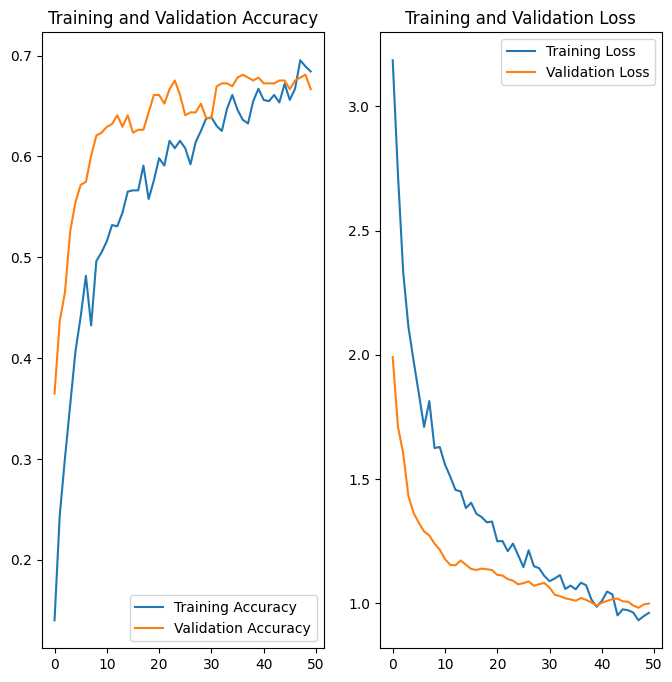

In [82]:
print_scores(model_t,val_ds,train_ds)
plot_accuracy_loss_graphs(history_t)

In [83]:
image_map = get_predicted_labels(model_t)
print('size of image map = ',len(image_map))


size of image map =  300


Predictions for Transfer Learning model using MobileNet. Titles are the model's predictions



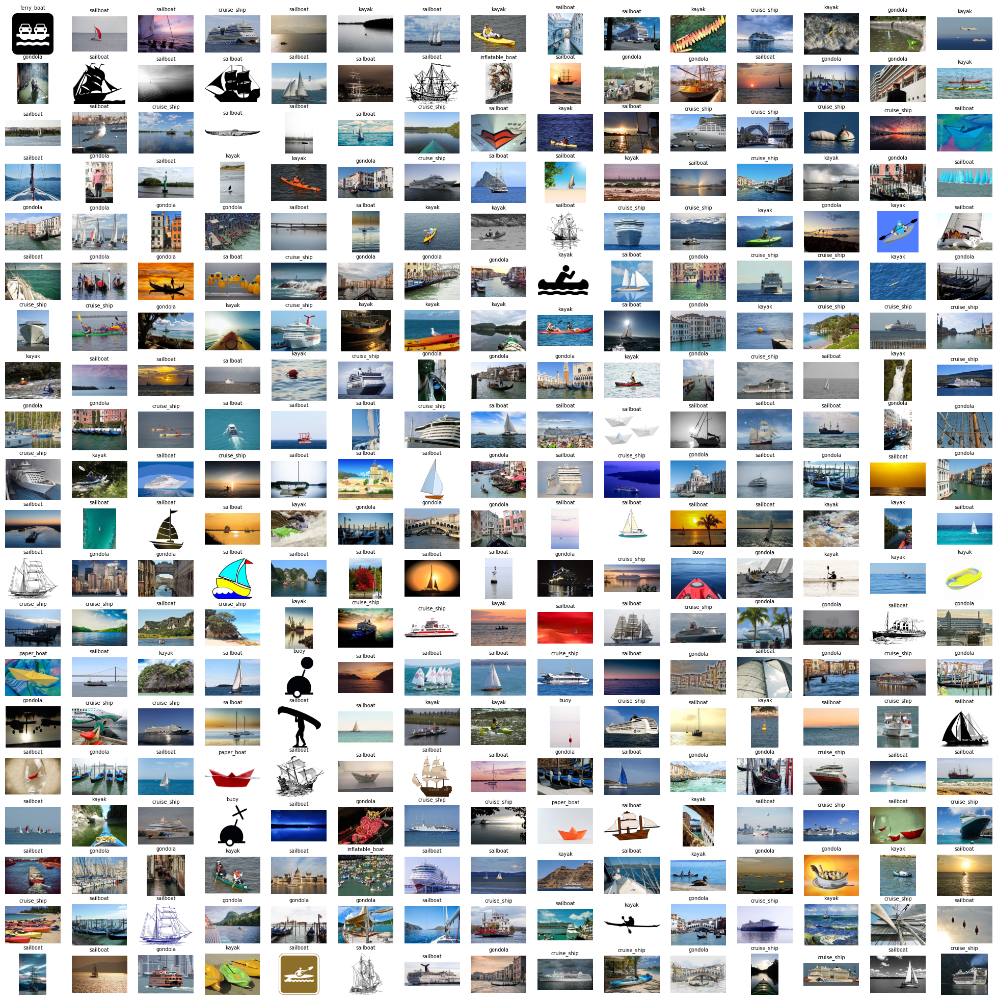

In [84]:
display_test_images(image_map,'Transfer Learning model using MobileNet. Titles are the model\'s predictions')

**Metrics**

In [85]:

true_labels, predicted_labels = get_metrics(model_t,val_ds,val_split=0.3)

348 10 28
31
320 320


**Confusion Matrix**

Confusion Matrix
[[ 2  0  0  0  0  0  2  0  8]
 [ 0 39  1  0  1  0  4  0  6]
 [ 0  3  3  0  3  0  2  0  6]
 [ 0  5  0  0  1  0  0  0  2]
 [ 0  1  0  0 44  0  2  0  4]
 [ 0  0  0  0  1  1  1  0  1]
 [ 1  6  0  0  5  0 43  0 12]
 [ 0  0  0  0  0  0  1  3  4]
 [ 0  6  0  0  8  0  8  0 80]]

Confusion Matrix Displayed



<Figure size 1000x1000 with 0 Axes>

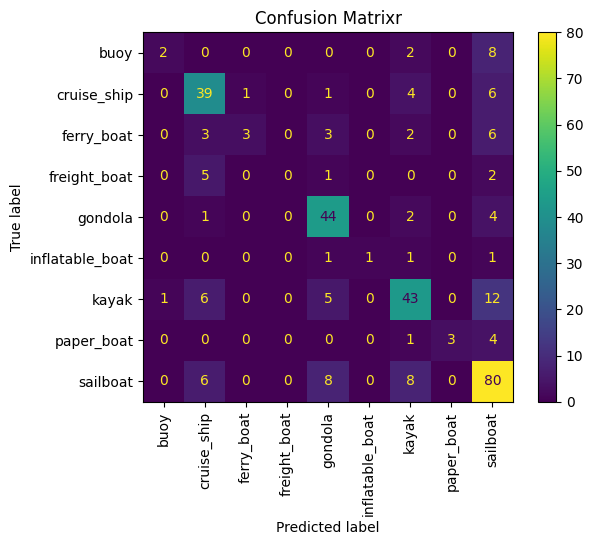

In [86]:
from sklearn.metrics import ConfusionMatrixDisplay
cm = confusion_matrix(true_labels,predicted_labels)
print('Confusion Matrix')
print(cm)
print()

print('Confusion Matrix Displayed\n')
plt.figure(figsize = (10,10))
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=class_names)
disp.plot()
plt.title('Confusion Matrixr')
plt.xticks(rotation=90)
plt.show()

**Classification Report**

In [87]:
from sklearn.metrics import classification_report
import warnings
warnings.filterwarnings('ignore')

cl_report = classification_report(true_labels,predicted_labels)
print(cl_report)

              precision    recall  f1-score   support

           0       0.67      0.17      0.27        12
           1       0.65      0.76      0.70        51
           2       0.75      0.18      0.29        17
           3       0.00      0.00      0.00         8
           4       0.70      0.86      0.77        51
           5       1.00      0.25      0.40         4
           6       0.68      0.64      0.66        67
           7       1.00      0.38      0.55         8
           8       0.65      0.78      0.71       102

    accuracy                           0.67       320
   macro avg       0.68      0.45      0.48       320
weighted avg       0.67      0.67      0.64       320



# Inferences #

#### CNN Model ####

The CNN model built in part 1 of this project gave an accuracy of around 65%. When tested on the 300 test images, we could see many mis-classificatons. THis could be because the training set contained just 1162 images and the code used only 80% of that for training. This is a very low number for the model to learn well. Given this limitation, an accuracy of 65% is vary good. The model has a bit of overfitting, though :


***Test accuracy: , train accuracy:***

#### Transfer Learning ####

> *I have used droupout for FCN as 0.5 to reduce overfitting. Lower dropout values increases training accuracy without improving testing accuracy. Dropout of 0.1 produces a training accuracy of 100% , but a test accuracy of only about 65%*

The transfer learning model using MobileNet with a **Dropout** of 0.5 gave 81% training accuracy and about 66% test accuracy pointing to some overfitting.
   

***Test accuracy:, train accuracy:***


#### Conclusion ####

Transfer learning doesnt seem to improve accuracy much. This could be because the MobileNet is not trained for different boat types. Checking the 1000 classes that this model is trained in, we find that there are only 7  classes that mentiones a boat. These are

1. pigboat,
2. submarine,U-boat
3. speedboat
4. paddle, boat paddle,
5. lifeboat.
6. fireboat,
7. boathouse

None of the above is part of our problem. So there isnt much that the MobileNet model can transfer to our model.